<a href="https://colab.research.google.com/github/Karishma-2212/MIC_Hackthon_Team_Nanobots/blob/main/Defect_Classification_and_clustering__Team_NanoBots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
### Load Necessary Libraries
!pip install hyperspy
from skimage.feature import peak_local_max as MaxPeak
import numpy as np
import matplotlib.pyplot as plt
import hyperspy.api as hs  # Corrected import statement
#from hyperspy.sam.signal_list import SignalList # Explicitly import SignalList
from scipy import ndimage
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
from scipy.optimize import curve_fit
from pylab import cm
import time
import copy
%matplotlib inline

In [10]:
class HandlerEllipse(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent
        p = mpatches.Ellipse(xy=center, width=width + xdescent,
                             height=height + ydescent)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]
def gauss(x,a,x0,sigma):
    return a*np.exp(-(x-x0)**2/sigma**2)
def bigauss(x,a1,a2,x01,x02,s1,s2):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    return a+b
def trigauss(x,a1,a2,a3,x01,x02,x03,s1,s2,s3):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    c=a3*np.exp(-(x-x03)**2/s3**2)
    return a+b+c
def tetragauss(x,a1,a2,a3,a4,x01,x02,x03,x04,s1,s2,s3,s4):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    c=a3*np.exp(-(x-x03)**2/s3**2)
    d=a4*np.exp(-(x-x04)**2/s4**2)
    return a+b+c+d
def pentagauss(x,a1,a2,a3,a4,a5,x01,x02,x03,x04,x05,s1,s2,s3,s4,s5):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    c=a3*np.exp(-(x-x03)**2/s3**2)
    d=a4*np.exp(-(x-x04)**2/s4**2)
    e=a5*np.exp(-(x-x05)**2/s5**2)
    return a+b+c+d+e

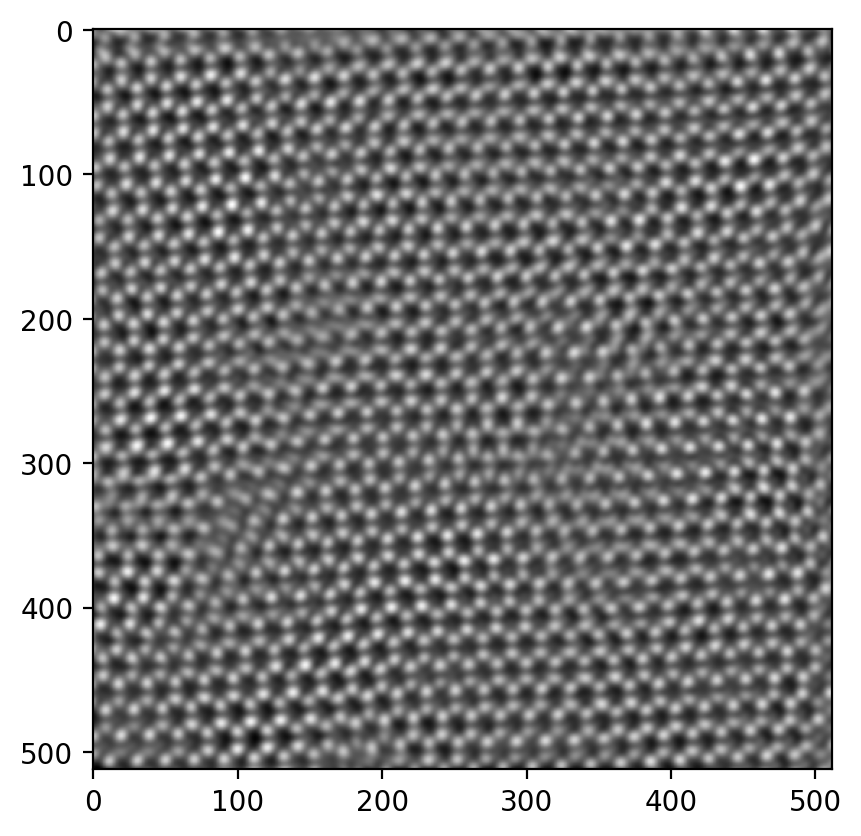

In [11]:
StackIn = hs.load('/content/IFFT of Untitled.dm3')
cal=StackIn.axes_manager[0].scale
Im=StackIn.data # Corrected: Removed np.sum to maintain 2D shape

### Optional Gaussian Bluring
Im = ndimage.gaussian_filter(Im, sigma=0.15)

### Normalize Image
nIm= (Im-np.amin(Im))/np.ptp(Im)

fig=plt.figure(dpi=200)
plt.imshow(nIm, cmap='gray')

This new cell uses Python's `zipfile` module for extraction. It includes checks to ensure the file exists and handles potential issues like corrupted zip files or other unexpected errors during the process. This approach is generally more robust within a Python notebook environment compared to relying on external shell commands like `!unzip` which might face environment-specific issues like the `FileNotFoundError` you encountered for `/bin/bash`.

# New Section

Text(10, 490, '2 nm')

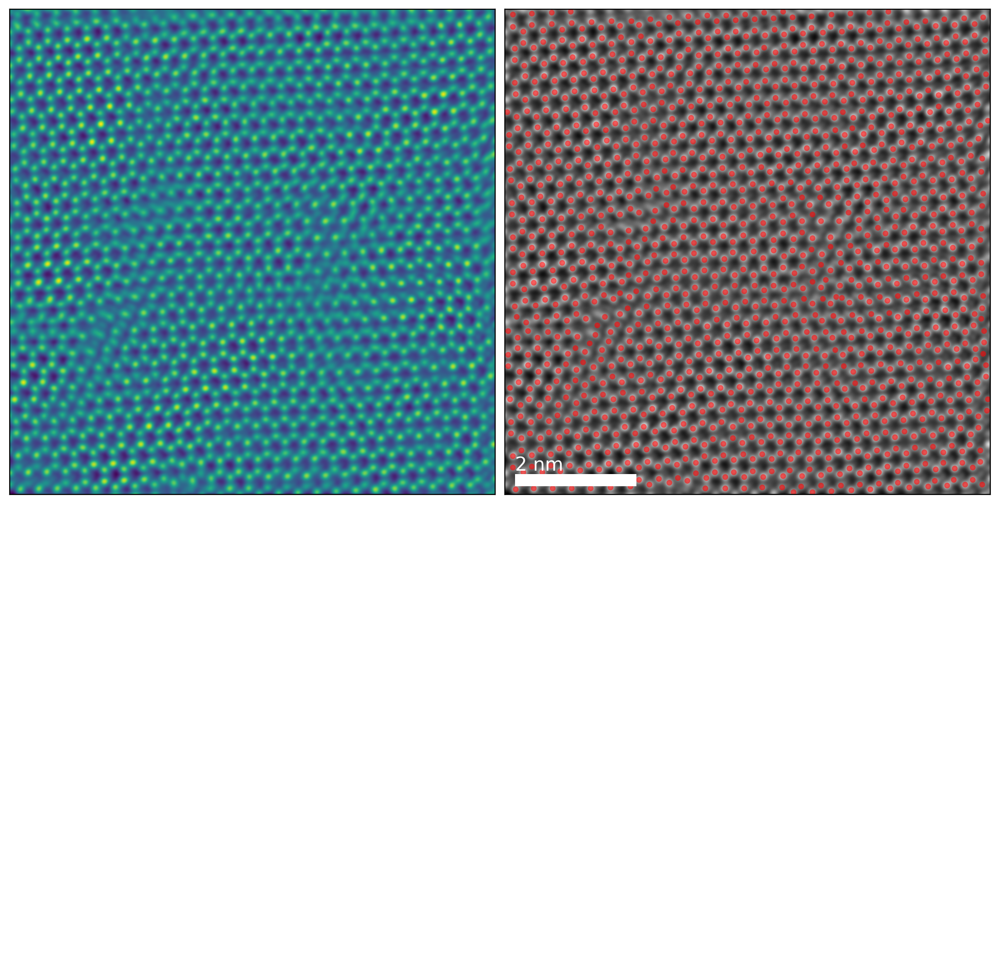

In [13]:
### Find all atoms in image
r=2
allatoms=MaxPeak(nIm,r, threshold_rel=0.025,exclude_border=True)
fig=plt.figure(figsize=(10.2,5),dpi=200)
ax=fig.add_axes([0,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
ax=fig.add_axes([0.5,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm, cmap='gray')
for atom in allatoms: ax.add_patch(Circle(atom[::-1], radius=1.5*r, alpha =.6 ,fc='red',lw=0.25))
ax.add_patch(Rectangle((10,490),2/cal,0.2/cal,fc="white"))
ax.text(10,490,'2 nm',ha='left',va='bottom',fontsize=14,color='white')

(0.0, 1.0)

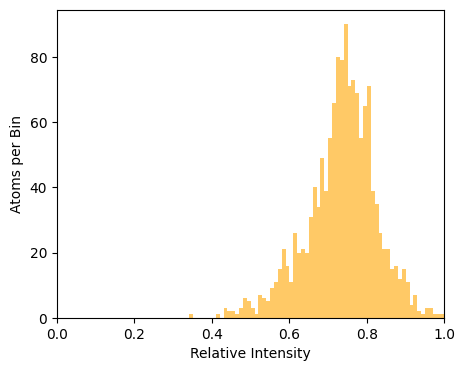

In [21]:
### Plot Histogram of Intensities
aint=[nIm[a[0]][a[1]] for a in allatoms]
fig=plt.figure(figsize=(5,4))
a=plt.hist(aint,100,range=(0,1),alpha=0.6,lw=0.5,color='Orange',histtype='stepfilled')
plt.xlabel('Relative Intensity')
plt.ylabel('Atoms per Bin')
plt.xlim(0,1)
### Note: Insufficient information to distinguish between all four species

In [22]:
### Sort into A Sites and B Sites (Note: A better programmer could probably improve this dramatically)

natoms=len(allatoms)
T=0.23 # Increased threshold for neighbor detection
def dist(a,b):
    return np.sqrt(np.sum((a[0]-b[0])**2+(a[1]-b[1])**2))
d=[];idx=[]
start=time.time()

### Step 1: Find Nearest Neighbors for all atoms
for i in range(natoms):
    if i==(natoms/100): print("1% in "+str(round(time.time()-start,2))+" seconds. Estimated Finish Time: "+str(round((time.time()-start)*100/60.,2))+" minutes")
    if i==(10*natoms/100):print("10% Finished")
    if i==(20*natoms/100):print("20% Finished")
    if i==(30*natoms/100):print("30% Finished")
    if i==(40*natoms/100):print("40% Finished")
    if i==(50*natoms/100):print("50% Finished")
    if i==(60*natoms/100):print("60% Finished")
    if i==(70*natoms/100):print("70% Finished")
    if i==(80*natoms/100):print("80% Finished")
    if i==(90*natoms/100):print("90% Finished")
    d.append([])
    idx.append([])
    for j in range(natoms):
        if i!=j and dist(allatoms[i],allatoms[j])*cal < T:
            d[i].append([(allatoms[i][1]-allatoms[j][1])*cal,(allatoms[i][0]-allatoms[j][0])*cal])
            idx[i].append(j)
ASite=[];BSite=[];BSitefromA=[];ASitefromB=[];Others=[]
step1=time.time()
print("Step 1 Time = " + str(step1-start) + " seconds")

### Step 2: Identify each atom as A-Site or B-Site depending on Coordination of Nearest Neighbors
###         (2 Above, 1 Below - A-Site, 2 Below, 1 Above - B-Site)
for i in range(natoms):
    if len(d[i])==3:
        pm=0
        for xyd in d[i]:
            if xyd[1]>0:pm+=1
            else: pm-=1
        if pm>0:
            ASite.append(i)
            BSitefromA.append(idx[i])
        else:
            BSite.append(i)
            ASitefromB.append(idx[i])
step2=time.time()
print("Step 2 Time = " + str(step2-step1) + " seconds")

### Step 3-7: If atom does not have 3 identified nearest neighbors, determine A/B identity by examinging labeled
###           nearest neighbors (if atom has all A-Site neighbors, identify as B-Site and vice versa). Loop
###           iteratively until all atoms identified. Throw away conflicts.
for a in ASite:
    if a in BSite:
        print("First Step")
        break
BfromA=[i for nn in BSitefromA for i in nn]
AfromB=[i for nn in ASitefromB for i in nn]
step3=time.time()
print("Step 3 Time = " + str(step3-step2) + " seconds")
for a in AfromB:
    if a not in ASite and a not in BSite: ASite.append(a)
for b in BfromA:
    if b not in BSite and b not in ASite: BSite.append(b)
Others=[]
for i in range(natoms):
    if i not in ASite and i not in BSite: Others.append(i)
for a in ASite:
    if a in BSite:
        print("Second Step")
        break
step4=time.time()
print("Step 4 Time = " + str(step4-step3) + " seconds")
print(natoms,len(ASite)+len(BSite)+len(Others),len(ASite),len(BSite),len(Others))
Changed=True
while Changed:
    print('Others Loop')
    NextO=[];Changed=False
    for o in Others:
        first=True;ProbA=False;ProbB=False
        for i in idx[o]:
            if first:
                first=False
                if i in ASite: ProbB=True
                if i in BSite: ProbA=True
            else:
                if i in ASite:
                    ProbB=True
                    if ProbA: ProbA=False;ProbB=False
                if i in BSite:
                    ProbA=True
                    if ProbB: ProbA=False;ProbB=False
        if ProbA and o not in ASite: ASite.append(o);Changed=True
        if ProbB and o not in BSite: BSite.append(o);Changed=True
        if not ProbA and not ProbB: NextO.append(o)
    Others=NextO
step5=time.time()
print("Step 5 Time = " + str(step5-step4) + " seconds")
print(len(allatoms),len(ASite)+len(BSite)+len(Others),len(ASite),len(BSite),len(Others))
oidx=[[] for i in range(natoms)]
for o in Others:
    for i in range(natoms):
        oidx[o].append((dist(allatoms[o],allatoms[i])*cal,i)) # Corrected oidx assignment
oidx=[sorted(o) for o in oidx]
step6=time.time()
print("Step 6 Time = " + str(step6-step5) + " seconds")
AfromO2=[];BfromO2=[]
for o_idx, o_neighbors in enumerate(oidx): # Iterating over enumerated oidx
    if o_idx not in Others: continue # Only process atoms still in Others list
    ino=0;ina=0;inb=0
    for oid_dist, oid_neighbor_idx in o_neighbors:
        if oid_neighbor_idx in Others: ino+=1
        elif oid_neighbor_idx in ASite: ina+=1 # Use elif for mutual exclusivity
        elif oid_neighbor_idx in BSite: inb+=1 # Use elif for mutual exclusivity
        if ina+inb-ino<-1: break
        if ina>1: AfromO2.append(o_idx); break
        if inb>1: BfromO2.append(o_idx); break

for a in AfromO2:
    if a not in ASite: ASite.append(a)
for b in BfromO2:
    if b not in BSite: BSite.append(b)

Others = [i for i in range(natoms) if (i not in ASite and i not in BSite)] # Recalculate Others
step7=time.time()
print("Step 7 Time = " + str(step7-step6) + " seconds")
print(len(allatoms),len(ASite)+len(BSite)+len(Others),len(ASite),len(BSite),len(Others))
Changed=True
while Changed:
    print('Others Loop')
    NextO=[];Changed=False
    for o in Others:
        if o in ASite: break
        if o in BSite: break
        first=True;ProbA=False;ProbB=False
        for i in idx[o]:
            if first:
                first=False
                if i in ASite: ProbB=True
                if i in BSite: ProbA=True
            else:
                if i in ASite:
                    ProbB=True
                    if ProbA: ProbA=False;ProbB=False
                if i in BSite:
                    ProbA=True
                    if ProbB: ProbA=False;ProbB=False
        if ProbA and o not in ASite: ASite.append(o);Changed=True
        if ProbB and o not in BSite: BSite.append(o);Changed=True
        if not ProbA and not ProbB: NextO.append(o)
    Others=NextO
step8=time.time()
print("Step 8 Time = " + str(step8-step7) + " seconds")
print(len(allatoms),len(ASite)+len(BSite)+len(Others),len(ASite),len(BSite),len(Others))

Step 1 Time = 20.223581075668335 seconds
Step 2 Time = 0.0018398761749267578 seconds
Step 3 Time = 0.005588531494140625 seconds
Step 4 Time = 0.033048152923583984 seconds
1417 1417 715 700 2
Others Loop
Others Loop
Step 5 Time = 0.0006597042083740234 seconds
1417 1417 716 701 0
Step 6 Time = 0.0011515617370605469 seconds
Step 7 Time = 0.011929035186767578 seconds
1417 1417 716 701 0
Others Loop
Step 8 Time = 0.0006392002105712891 seconds
1417 1417 716 701 0


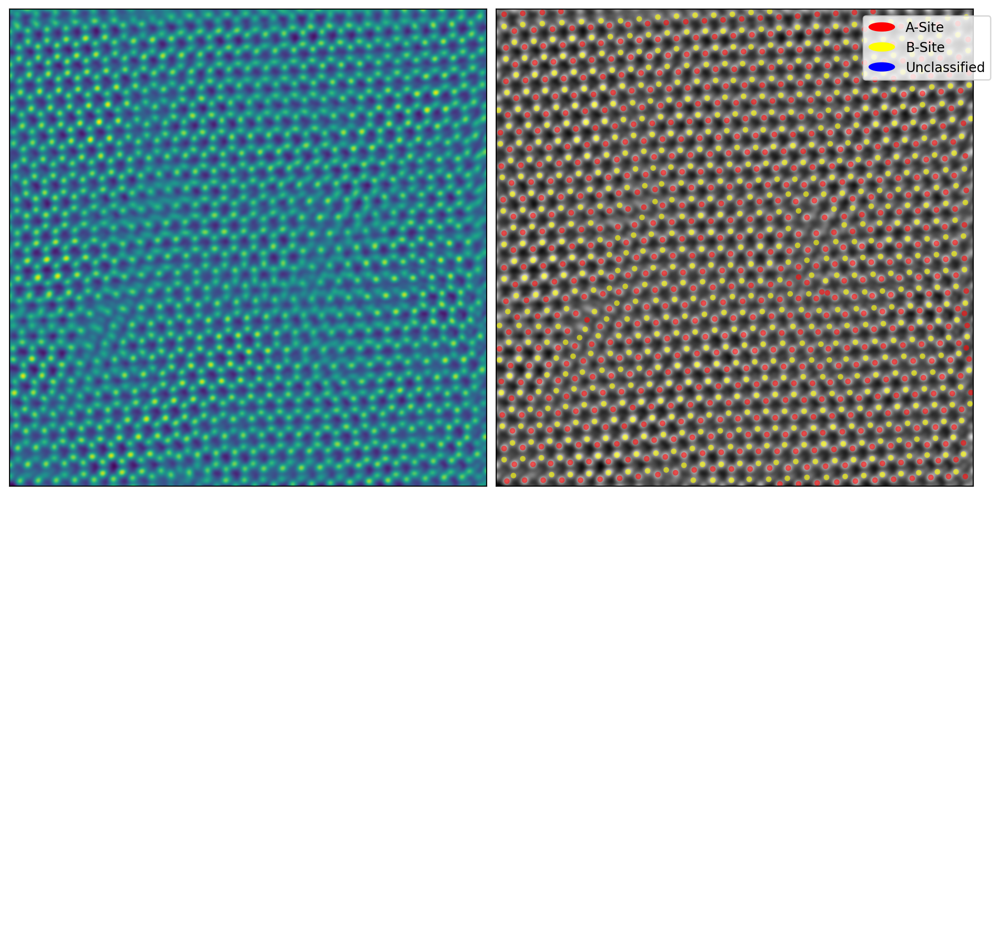

In [23]:
### Show Result of AB Sorting
fig=plt.figure(figsize=(10.2,5),dpi=200)
ax=fig.add_axes([0,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
ax=fig.add_axes([0.5,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm, cmap= 'gray')

# Identify unclassified atoms
all_classified_indices = set(ASite + BSite)
UnclassifiedAtoms = []
for i in range(len(allatoms)):
    if i not in all_classified_indices:
        UnclassifiedAtoms.append(i)

for a_idx in ASite: ax.add_patch(Circle((allatoms[a_idx][1],allatoms[a_idx][0]),alpha=0.6, radius=1.5*r,fc='r',lw=0.25))
for b_idx in BSite: ax.add_patch(Circle((allatoms[b_idx][1],allatoms[b_idx][0]),alpha=0.6, radius=1.5*r,fc='Yellow',lw=0.25))
for u_idx in UnclassifiedAtoms: ax.add_patch(Circle((allatoms[u_idx][1],allatoms[u_idx][0]),alpha=0.6, radius=1.5*r,fc='blue',lw=0.25, label='Unclassified'))

ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')

# Add a legend to indicate the unclassified atoms
# You might need to adjust legend position based on your plot
handles = [
    mpatches.Circle((0, 0), radius=2*r, fc='r', label='A-Site'),
    mpatches.Circle((0, 0), radius=2*r, fc='Yellow', label='B-Site'),
    mpatches.Circle((0, 0), radius=2*r, fc='BLUE', label='Unclassified')
]
ax.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.05, 1), handler_map={mpatches.Circle: HandlerEllipse()})

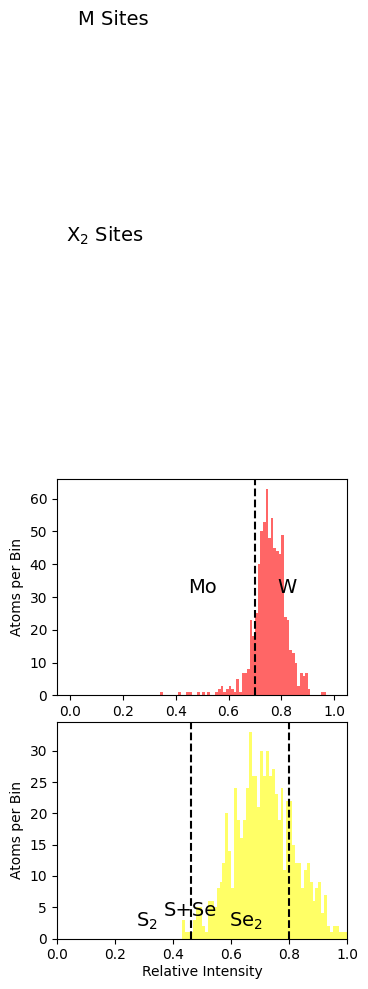

In [24]:
### Plot histogram of intensities and determine thresholds between atomic species

### Set A Site Thresholds as List
at=[0.7]

### Set B Site Thresholds as List
bt=[0.46,0.8]

Aatoms=[allatoms[a] for a in ASite]
Batoms=[allatoms[b] for b in BSite]
Aint=[nIm[a[0],a[1]] for a in Aatoms]
Bint=[nIm[b[0],b[1]] for b in Batoms]
fig=plt.figure(figsize=(3.5,5))
ax=fig.add_subplot(211)
a=ax.hist(Aint,100,range=(0,1),alpha=0.6,lw=0.5,color='r',histtype='stepfilled')
ax.text(0.03,209,'M Sites',fontsize=14,va='top')
ax.text(0.5,30,'Mo',fontsize=14,va='bottom',ha='center')
ax.text(0.82,30,'W',fontsize=14,va='bottom',ha='center')
for t in at: ax.axvline(t,ls='--',color='k')
ax.set_ylabel('Atoms per Bin')
ax=fig.add_subplot(212)
b=ax.hist(Bint,100,range=(0,1),alpha=0.6,lw=0.5,color='Yellow',histtype='stepfilled')
for t in bt: ax.axvline(t,ls='--',color='k')
ax.text(0.03,114,r'$\mathregular{X_2}$ Sites',fontsize=14,va='top')
ax.text(0.31,1,r'$\mathregular{S_2}$',fontsize=14,va='bottom',ha='center')
ax.text(0.46,3,'S+Se',fontsize=14,va='bottom',ha='center')
ax.text(0.65,1,r'$\mathregular{Se_2}$',fontsize=14,va='bottom',ha='center')
plt.xlabel('Relative Intensity',labelpad=2)
ax.set_ylabel('Atoms per Bin')
plt.xlim(0,1)
plt.subplots_adjust(bottom=0.08,top=1,right=0.97,left=0.14,hspace=0.12)
at.append(1.0);bt.append(1.0)

In [25]:
### Use thresholds to sort atoms into individual atomic species

# Ensure 'at' and 'bt' are correctly defined with their thresholds
at = [0.8, 1.0]
bt = [0.555, 0.755, 1.0]

Asort=[[] for i in range(len(at))]
AsortI=[[] for i in range(len(at))]
Asortidx=[[] for i in range(len(at))]

print(f"DEBUG: len(Aatoms) before A-site loop = {len(Aatoms)}")
print(f"DEBUG: len(Aint) before A-site loop = {len(Aint)}") # Changed 'aint' to 'Aint'

for i in range(len(Aint)): # Iterate using explicit index, changed 'aint' to 'Aint'
    if i >= len(Aatoms): # Safety check for potential length mismatch
        print(f"Warning: Index {i} out of bounds for Aatoms (length {len(Aatoms)}). Skipping this A-site atom.")
        continue

    atom_coords = Aatoms[i]
    intensity = Aint[i] # Changed 'aint' to 'Aint'

    asorted=False
    for t_idx, threshold_val in enumerate(at):
        if intensity < threshold_val:
            Asort[t_idx].append(atom_coords)
            AsortI[t_idx].append(intensity)
            # Corrected to safely get the integer index and avoid DeprecationWarning
            atom_idx_in_allatoms = np.where((allatoms==atom_coords).all(axis=1))[0]
            if len(atom_idx_in_allatoms) > 0:
                Asortidx[t_idx].append(int(atom_idx_in_allatoms[0]))
            else:
                print(f"Warning: Atom {atom_coords} not found in allatoms.")
            asorted=True
            break

Bsort=[[] for i in range(len(bt))]
BsortI=[[] for i in range(len(bt))]
Bsortidx=[[] for i in range(len(bt))]

print(f"DEBUG: len(Batoms) before B-site loop = {len(Batoms)}")
print(f"DEBUG: len(Bint) before B-site loop = {len(Bint)}") # Changed 'bint' to 'Bint'

for i in range(len(Bint)): # Iterate using explicit index, changed 'bint' to 'Bint'
    if i >= len(Batoms): # Safety check for potential length mismatch
        print(f"Warning: Index {i} out of bounds for Batoms (length {len(Batoms)}). Skipping this B-site atom.")
        continue

    atom_coords = Batoms[i]
    intensity = Bint[i] # Changed 'bint' to 'Bint'

    bsorted=False
    for t_idx, threshold_val in enumerate(bt):
        if intensity < threshold_val:
            Bsort[t_idx].append(atom_coords)
            BsortI[t_idx].append(intensity)
            # Corrected to safely get the integer index and avoid DeprecationWarning
            atom_idx_in_allatoms = np.where((allatoms==atom_coords).all(axis=1))[0]
            if len(atom_idx_in_allatoms) > 0:
                Bsortidx[t_idx].append(int(atom_idx_in_allatoms[0]))
            else:
                print(f"Warning: Atom {atom_coords} not found in allatoms.")
            bsorted=True
            break

Isort=BsortI+AsortI
IdxSort=Asortidx+Bsortidx
AtomSort=Asort+Bsort

DEBUG: len(Aatoms) before A-site loop = 716
DEBUG: len(Aint) before A-site loop = 716
DEBUG: len(Batoms) before B-site loop = 701
DEBUG: len(Bint) before B-site loop = 701


/tmp/ipython-input-393396798.py:5: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(Isort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)


Text(0, 0.5, 'Atoms per Bin')

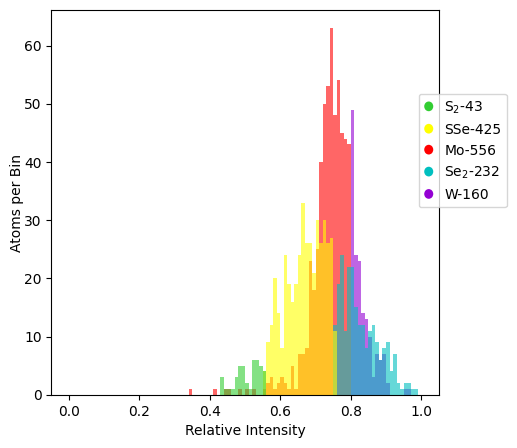

In [26]:
### Plot sorted histogram

colors=['LimeGreen','Yellow','c','r','DarkViolet']
fig=plt.figure(figsize=(5,5))
plt.hist(Isort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)
S2=Circle((-10,-10),radius=5,fc='LimeGreen',lw=0.25,label=r'$\mathregular{S_2}$-'+str(len(Bsort[0])))
SSe=Circle((-10,-10),radius=5,fc='Yellow',lw=0.25,label='SSe-'+str(len(Bsort[1])))
Mo=Circle((-10,-10),radius=5,fc='r',lw=0.25,label='Mo-'+str(len(Asort[0])))
Se2=Circle((-10,-10),radius=5,fc='c',lw=0.25,label=r'$\mathregular{Se_2}$-'+str(len(Bsort[2])))
W=Circle((-10,-10),radius=5,fc='DarkViolet',lw=0.25,label='W-'+str(len(Asort[1])))

plt.legend(handles=[S2,SSe,Mo,Se2,W],handlelength=0.65,handler_map={Circle:HandlerEllipse()},bbox_to_anchor=(0.93, 0.8))
plt.xlabel("Relative Intensity")
plt.ylabel("Atoms per Bin",labelpad=0)


/tmp/ipython-input-437053585.py:14: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ka[kma.labels_[a[0]]].append(float(Az[a[0]]))
/tmp/ipython-input-437053585.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  kb[kmb.labels_[b[0]]].append(float(Bz[b[0]]))
/tmp/ipython-input-437053585.py:31: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(kIsort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)


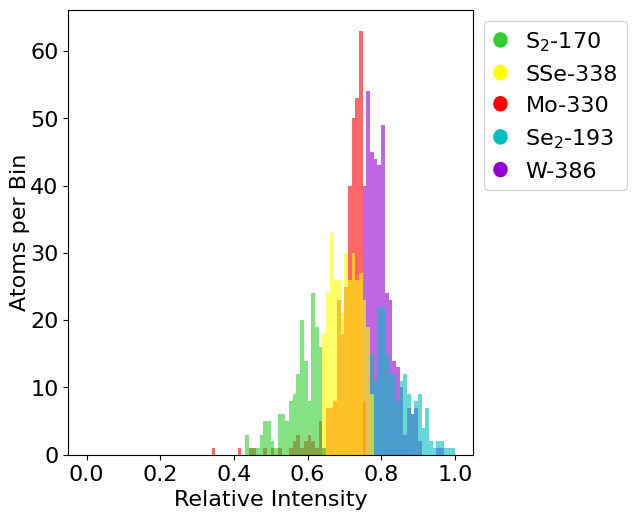

In [27]:
### Optional: As opposed to setting limits based on dips in histogram use k-means clustering for objective labelling

from sklearn.cluster import KMeans
Az = np.float32(Aint).reshape(len(Aint),1)
Bz = np.float32(Bint).reshape(len(Bint),1)
na,nb=2,3
kma = KMeans(n_clusters=2, random_state=0).fit(Az)
kmb = KMeans(n_clusters=3, random_state=0).fit(Bz)
ka=[[] for n in range(na)]
kia=[[] for n in range(na)]
kb=[[] for n in range(nb)]
kib=[[] for n in range(nb)]
for a in enumerate(Aatoms):
    ka[kma.labels_[a[0]]].append(float(Az[a[0]]))
    kia[kma.labels_[a[0]]].append(a[1])
for b in enumerate(Batoms):
    kb[kmb.labels_[b[0]]].append(float(Bz[b[0]]))
    kib[kmb.labels_[b[0]]].append(b[1])
kAatoms=list(zip(ka,kia));kAatoms.sort(key=lambda x: np.average(x[0]))
kBatoms=list(zip(kb,kib));kBatoms.sort(key=lambda x: np.average(x[0]))
kAsortI=[species[0] for species in kAatoms]
kBsortI=[species[0] for species in kBatoms]
kAsort=[species[1] for species in kAatoms]
kBsort=[species[1] for species in kBatoms]
kIsort=kBsortI+kAsortI

colors=['LimeGreen','Yellow','c','r','DarkViolet']
fig=plt.figure(figsize=(5,5))
#ax=fig.add_axes([0,0,1,1])
ax=fig.add_subplot(111)
plt.hist(kIsort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)
#plt.hist(kb+ka,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)
S2=Circle((-10,-10),radius=5,fc='LimeGreen',lw=0.25,label=r'$\mathregular{S_2}$-'+str(len(kBsort[0])))
SSe=Circle((-10,-10),radius=5,fc='Yellow',lw=0.25,label='SSe-'+str(len(kBsort[1])))
Mo=Circle((-10,-10),radius=5,fc='r',lw=0.25,label='Mo-'+str(len(kAsort[0])))
Se2=Circle((-10,-10),radius=5,fc='c',lw=0.25,label=r'$\mathregular{Se_2}$-'+str(len(kBsort[2])))
W=Circle((-10,-10),radius=5,fc='DarkViolet',lw=0.25,label='W-'+str(len(kAsort[1])))

plt.legend(handles=[S2,SSe,Mo,Se2,W],handlelength=0.65,handler_map={Circle:HandlerEllipse()},bbox_to_anchor=(1, 1),fontsize=16)
plt.xlabel("Relative Intensity",fontsize=16)
plt.ylabel("Atoms per Bin",labelpad=0,fontsize=16)
ax.tick_params(labelsize=16)
plt.subplots_adjust(left=0.15,right=0.96,top=1)

### Note: k-means clustering picks up tail of Mo peak as W atoms.

Text(20, 490, '4 nm')

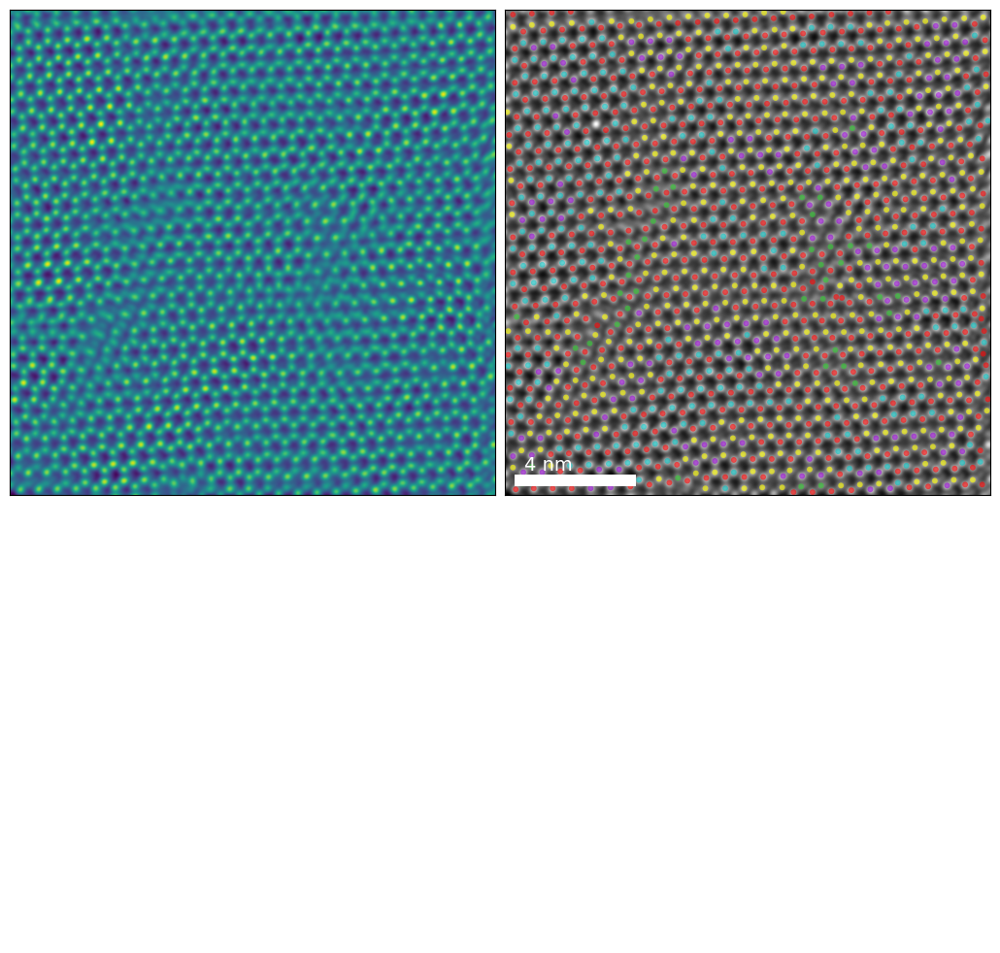

In [28]:
### Plot Atom-Labeled Image with Manually Set Thresholds
fig=plt.figure(figsize=(10.2,5))
ax=fig.add_axes([0,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
ax=fig.add_axes([0.5,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm, cmap='gray')
Acolors='r','darkviolet'
Bcolors='limegreen','Yellow','c'
for A in enumerate(Asort):
    for a in A[1]:
        ax.add_patch(Circle((a[1],a[0]),alpha=0.6, radius=1.5*r,fc=Acolors[A[0]],lw=0.25))
for B in enumerate(Bsort):
    for b in B[1]:
        ax.add_patch(Circle((b[1],b[0]),alpha=0.6, radius=1.5*r,fc=Bcolors[B[0]],lw=0.25))
ax.add_patch(Rectangle((10,490),2/cal,0.2/cal,fc="white"))
ax.text(20,490,'4 nm',ha='left',va='bottom',fontsize=14,color='white')

Text(20, 490, '4 nm')

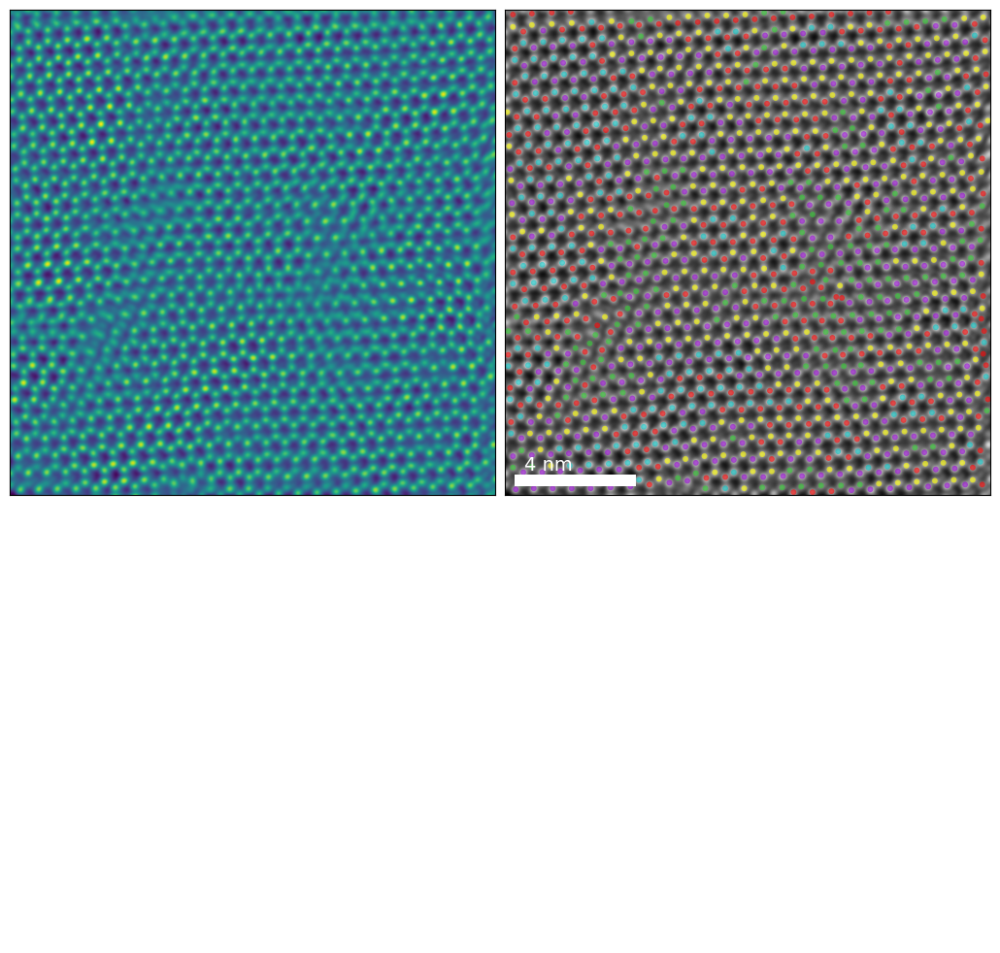

In [29]:
### Plot Atom-Labeled Image with K-Means Clustering Labeled Atoms
fig=plt.figure(figsize=(10.2,5))
ax=fig.add_axes([0,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
ax=fig.add_axes([0.5,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm, cmap='gray')
Acolors='r','DarkViolet'
Bcolors='LimeGreen','Yellow','c'
for A in enumerate(kAsort):
    for a in A[1]:
        ax.add_patch(Circle((a[1],a[0]),alpha=0.6, radius=1.5*r,fc=Acolors[A[0]],lw=0.25))
for B in enumerate(kBsort):
    for b in B[1]:
        ax.add_patch(Circle((b[1],b[0]),alpha=0.6, radius=1.5*r,fc=Bcolors[B[0]],lw=0.25))
ax.add_patch(Rectangle((10,490),2/cal,0.2/cal,fc="white"))
ax.text(20,490,'4 nm',ha='left',va='bottom',fontsize=14,color='white')


Cell to create patches of 64 *64 pixels for model training

Generated 225 patches of size 64x64 pixels.
Saved 225 patches to 'output_patches' directory.


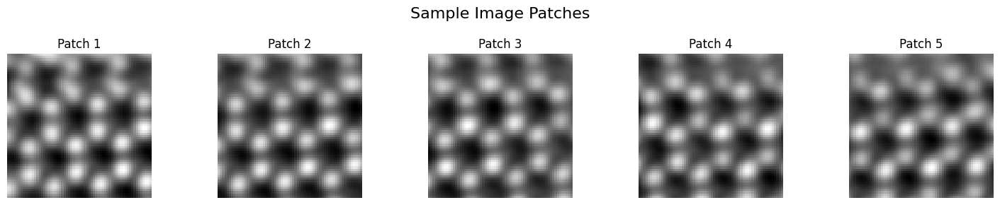


Summary of generated image patches:
Total number of patches: 225
Patch size: 64x64 pixels
Stride (overlap): 32 pixels
These patches can now be used for localized defect identification. By processing smaller, overlapping regions,       it's possible to apply more focused analysis methods, potentially improving the detection accuracy of subtle defects       that might be missed when analyzing the entire image at once. Machine learning models, for instance, often benefit       from fixed-size input patches for classification or segmentation tasks.


In [30]:
import os
from skimage.io import imsave # Import imsave for saving images
import numpy as np # Import numpy for data type conversion

patch_size = 64 # Changed to 64 as per task description
stride = 32 # Changed to 32 as per task description

image_height, image_width = nIm.shape

patches = []

# Calculate how many patches can be extracted horizontally and vertically
# Ensure that the patches do not go beyond the image boundaries
for y in range(0, image_height - patch_size + 1, stride):
    for x in range(0, image_width - patch_size + 1, stride):
        patch = nIm[y:y + patch_size, x:x + patch_size]
        patches.append(patch)

print(f"Generated {len(patches)} patches of size {patch_size}x{patch_size} pixels.")

# --- Add code to save patches ---
output_patches_dir = "output_patches"
os.makedirs(output_patches_dir, exist_ok=True)

for i, patch in enumerate(patches):
    patch_filename = os.path.join(output_patches_dir, f"patch_{i+1:04d}.png")
    # Convert the float image data (0-1 range) to uint8 (0-255 range) before saving
    # This is necessary because PNG typically doesn't support float data directly.
    patch_uint8 = (patch * 255).astype(np.uint8)
    imsave(patch_filename, patch_uint8) # Save each patch
print(f"Saved {len(patches)} patches to '{output_patches_dir}' directory.")
# --- End of added code ---


# Visualize a few sample patches
num_samples = min(5, len(patches)) # Display up to 5 patches, or fewer if less are generated

if num_samples > 0:
    fig, axes = plt.subplots(1, num_samples, figsize=(num_samples * 3, 3))
    if num_samples == 1:
        axes = [axes] # Make it iterable if only one subplot
    fig.suptitle('Sample Image Patches', fontsize=16)

    for i in range(num_samples):
        ax = axes[i]
        ax.imshow(patches[i], cmap='gray')
        ax.set_title(f'Patch {i+1}')
        ax.axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()
else:
    print("No patches were generated.")

# Summary for defect identification (as requested in the task)
print("\nSummary of generated image patches:")
print(f"Total number of patches: {len(patches)}")
print(f"Patch size: {patch_size}x{patch_size} pixels")
print(f"Stride (overlap): {stride} pixels")
print("These patches can now be used for localized defect identification. By processing smaller, overlapping regions, \
      it's possible to apply more focused analysis methods, potentially improving the detection accuracy of subtle defects \
      that might be missed when analyzing the entire image at once. Machine learning models, for instance, often benefit \
      from fixed-size input patches for classification or segmentation tasks.")


# Task
Extract square patches of size 64x64 pixels from the `nIm` (normalized image) with a stride of 32 pixels for overlap, storing these patches in a list, and then visualize a few sample patches to confirm correct generation. The final output will be a summary of the generated image patches and their use for defect identification.

# Task
Estimate the lattice vectors by analyzing the previously computed `d` list of nearest-neighbor displacement vectors. Flatten this list, convert the vectors to `[dx, dy]` format, and then apply KMeans clustering with an appropriate number of clusters (likely 3, given the prior A/B site sorting indicating a hexagonal-like structure) to determine the average displacement vectors representing the lattice.

## Estimate Lattice Vectors

### Subtask:
Calculate the average nearest-neighbor displacement vectors in pixel units by analyzing the previously computed `d` list and clustering these displacements.


**Reasoning**:
The subtask requires calculating average nearest-neighbor displacement vectors. This involves flattening the list of displacement vectors, applying KMeans clustering to group similar displacements, and then extracting the cluster centers as the average vectors.



In [31]:
from sklearn.cluster import KMeans

# 1. Initialize an empty list called `flattened_vectors`
flattened_vectors = []

# 2. Iterate through the `d` list and append each [dx, dy] vector
for atom_displacements in d:
    for vector in atom_displacements:
        flattened_vectors.append(vector)

# 3. Convert `flattened_vectors` into a NumPy array
flattened_vectors_np = np.array(flattened_vectors)

# 4. Import `KMeans` from `sklearn.cluster` (already done at the beginning of the block)

# 5. Initialize a `KMeans` model with `n_clusters=3` and `random_state=0`
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10) # Added n_init to suppress warning

# 6. Fit the `KMeans` model to the `flattened_vectors` array
kmeans.fit(flattened_vectors_np)

# 7. Extract the cluster centers
average_displacement_vectors = kmeans.cluster_centers_

print("Average nearest-neighbor displacement vectors (in pixel units):")
print(average_displacement_vectors)

Average nearest-neighbor displacement vectors (in pixel units):
[[ 0.08416011  0.13599579]
 [ 0.07298115 -0.14400492]
 [-0.15734649  0.00863487]]


## Identify Vacancy Candidates

### Subtask:
Iterate through all existing A and B site atoms, predict the locations of their ideal neighbors using the estimated lattice vectors, and identify potential vacancy candidates where an expected neighbor is missing.


**Reasoning**:
The subtask requires identifying vacancy candidates by iterating through A and B site atoms, predicting their ideal neighbor locations using estimated lattice vectors, and checking for missing atoms within a defined radius. I need to initialize the vacancy lists, convert lattice vectors to pixel units, and then loop through each A and B site atom. For each atom, I will calculate predicted neighbor positions and check if an existing atom is present within the radius 'r' using the `dist` function. If no atom is found, the predicted position is added to the corresponding vacancy list.



In [32]:
import numpy as np
from scipy.spatial import cKDTree

# ----------------------------
# Inputs required from your notebook:
# allatoms: list/array of [row, col]
# ASite, BSite: lists of indices into allatoms
# average_displacement_vectors: array of [d_col*cal, d_row*cal] (real units)
# cal: real_units_per_pixel
# img: 2D HAADF image (for bounds)
# r: peak radius in pixels (optional)
# ----------------------------

allcoords = np.asarray(allatoms, dtype=np.float32)  # shape (N,2) [row, col]

# Convert avg displacement vectors from real units -> pixels
# average_displacement_vectors assumed = [d_col*cal, d_row*cal]
avg_disp_vectors_px = np.asarray(average_displacement_vectors, dtype=np.float32) / float(cal)  # [d_col_px, d_row_px]

# Optional: remove near-duplicate vectors (very important!)
# Bin vectors to reduce duplicates
vec_bin = 0.25  # pixels; tune 0.1-0.5
binned_vec = np.round(avg_disp_vectors_px / vec_bin) * vec_bin
avg_disp_vectors_px = np.unique(binned_vec, axis=0)

print("Using", len(avg_disp_vectors_px), "unique displacement vectors")

# Build KD-trees for fast neighbor lookup
A_coords = allcoords[np.asarray(ASite, dtype=int)]
B_coords = allcoords[np.asarray(BSite, dtype=int)]
all_tree = cKDTree(allcoords) # KD-tree for all atoms

H, W = nIm.shape # Use nIm instead of img for bounds, as nIm is defined and used.

# Choose a better search radius:
# If you know lattice spacing in pixels, use ~0.35*spacing.
# If not, keep your r-based rule but cap it.
neighbor_search_radius = float(min(max(1.0, 1.2 * r), 6.0))  # safe-ish default
print("Neighbor search radius (px):", neighbor_search_radius)

def in_bounds(rc):
    r0, c0 = rc
    return (0 <= r0 < H) and (0 <= c0 < W)

def dedupe_points(points_rc, bin_px):
    """Deduplicate by binning to a grid of bin_px."""
    if len(points_rc) == 0:
        return np.empty((0,2), dtype=np.float32)
    pts = np.asarray(points_rc, dtype=np.float32)
    b = np.round(pts / bin_px) * bin_px
    return np.unique(b, axis=0)

# ----------------------------
# Identify all potential vacancies
# ----------------------------
all_potential_vacancies_list = []

# Iterate through all detected atom coordinates
for atom_rc in allcoords:  # [row, col]
    for v in avg_disp_vectors_px:  # [d_col_px, d_row_px]
        # Predict neighbor in positive direction
        pred_pos_1 = np.array([atom_rc[0] + v[1], atom_rc[1] + v[0]], dtype=np.float32)
        # Predict neighbor in negative direction
        pred_pos_2 = np.array([atom_rc[0] - v[1], atom_rc[1] - v[0]], dtype=np.float32)

        for pred in [pred_pos_1, pred_pos_2]:
            if not in_bounds(pred):
                continue

            # Check if any atom exists near predicted position
            distance_from_tree, _ = all_tree.query(pred, k=1)
            if distance_from_tree > neighbor_search_radius:
                all_potential_vacancies_list.append(pred)

# Deduplicate all potential vacancies
all_potential_vacancies = dedupe_points(all_potential_vacancies_list, bin_px=neighbor_search_radius/2)

print(f"Found {len(all_potential_vacancies)} deduplicated potential vacancies (geometry-only).")

Using 3 unique displacement vectors
Neighbor search radius (px): 2.4
Found 6834 deduplicated potential vacancies (geometry-only).


## Classify and Filter Vacancies

### Subtask:
For each potential vacancy candidate, determine if it should be an A-site or B-site vacancy based on the types of actual atoms in its immediate vicinity. Remove any candidates that are too close to already detected atoms or are duplicates.


**Reasoning**:
The subtask requires classifying and filtering vacancy candidates based on their surrounding atomic environment. This involves deduplicating potential vacancy locations, creating efficient lookup structures for existing atoms, and then iterating through each candidate to check its neighbors against predefined criteria to determine if it should be an A-site or B-site vacancy.



In [35]:
import numpy as np
from scipy.spatial import cKDTree

# ============================================================
# FIND ALL TRUE LATTICE VACANCIES (NO A/B CLASSIFICATION)
#
# Requires existing variables:
#   allatoms : [row, col] atomic positions
#   ASite, BSite : indices from your lattice-sorting code
#   average_displacement_vectors : [d_col*cal, d_row*cal]
#   cal : real units per pixel
#   nIm : HAADF image (optional intensity check)
#   r : peak radius
#
# Output:
#   vacancies_rc : (N,2) array of [row,col] true vacancies
# ============================================================

# ----------------------------
# Setup
# ----------------------------
allcoords = np.asarray(allatoms, dtype=np.float32)
A_coords = allcoords[np.asarray(ASite, dtype=int)]
B_coords = allcoords[np.asarray(BSite, dtype=int)]

all_tree = cKDTree(allcoords)
A_tree   = cKDTree(A_coords)
B_tree   = cKDTree(B_coords)

H, W = nIm.shape

def in_bounds(rc):
    return (0 <= rc[0] < H) and (0 <= rc[1] < W)

# ----------------------------
# Lattice spacing → radii
# ----------------------------
nn_d, _ = all_tree.query(allcoords, k=2)
nn_spacing = float(np.median(nn_d[:,1]))

R_abs = 0.35 * nn_spacing   # atom-absence radius
R_env = 0.90 * nn_spacing   # environment radius

R_abs = float(np.clip(R_abs, 1.0, 6.0))
R_env = float(np.clip(R_env, 2.0, 12.0))

print("NN spacing(px):", round(nn_spacing,3),
      "R_abs:", round(R_abs,3),
      "R_env:", round(R_env,3))

# ----------------------------
# Displacement vectors → pixels
# ----------------------------
avg_disp_px = np.asarray(average_displacement_vectors, dtype=np.float32) / float(cal)

# Deduplicate lattice vectors
vec_bin = 0.25
avg_disp_px = np.unique(np.round(avg_disp_px / vec_bin) * vec_bin, axis=0)

print("Using", len(avg_disp_px), "unique lattice vectors")

# ----------------------------
# Optional intensity filter
# ----------------------------
def mean_intensity_circle(img, r0, c0, rad=2):
    rr = int(round(r0)); cc = int(round(c0))
    rmin, rmax = max(0, rr-rad), min(img.shape[0], rr+rad+1)
    cmin, cmax = max(0, cc-rad), min(img.shape[1], cc+rad+1)
    Rs = np.arange(rmin, rmax)
    Cs = np.arange(cmin, cmax)
    C, R = np.meshgrid(Cs, Rs)
    mask = (R-r0)**2 + (C-c0)**2 <= rad*rad
    vals = img[R[mask], C[mask]]
    return float(vals.mean()) if vals.size else np.nan

use_intensity = True
if use_intensity:
    I_real = np.array([mean_intensity_circle(nIm, r0, c0, rad=2)
                       for r0,c0 in allcoords])
    I_thr = float(np.nanpercentile(I_real, 10))
    print("Intensity threshold (10th pct):", I_thr)

# ----------------------------
# Helper: deduplicate points
# ----------------------------
def dedupe(points, bin_px):
    if len(points) == 0:
        return np.empty((0,2), dtype=np.float32)
    pts = np.asarray(points, dtype=np.float32)
    b = np.round(pts / bin_px) * bin_px
    return np.unique(b, axis=0)

# ============================================================
# STEP 1: Propose expected lattice sites
# ============================================================
candidates = []

for atom_rc in allcoords:
    for v in avg_disp_px:
        p1 = np.array([atom_rc[0] + v[1], atom_rc[1] + v[0]], dtype=np.float32)
        p2 = np.array([atom_rc[0] - v[1], atom_rc[1] - v[0]], dtype=np.float32)
        if in_bounds(p1): candidates.append(p1)
        if in_bounds(p2): candidates.append(p2)

candidates = dedupe(candidates, bin_px=R_abs/2)
print("Candidate lattice sites:", len(candidates))

# ============================================================
# STEP 2: Vacancy filtering using lattice environment
# ============================================================
vacancies = []

for p in candidates:

    # 1) Absence check
    dmin, _ = all_tree.query(p, k=1)
    if dmin <= R_abs:
        continue

    # 2) Environment check (must resemble a real lattice site)
    nA = len(A_tree.query_ball_point(p, r=R_env))
    nB = len(B_tree.query_ball_point(p, r=R_env))

    # must have neighbors, and not be a mixed random environment
    if (nA + nB) < 2:
        continue
    if not (nA == 0 or nB == 0):
        continue

    # 3) Optional intensity check
    if use_intensity:
        I = mean_intensity_circle(nIm, p[0], p[1], rad=2)
        if np.isnan(I) or I > I_thr:
            continue

    vacancies.append(p)

# Final dedupe
vacancies_rc = dedupe(vacancies, bin_px=R_abs/2)

print("FINAL TRUE VACANCIES:", len(vacancies_rc))

# vacancies_rc is your final answer: array of [row,col]


NN spacing(px): 11.045 R_abs: 3.866 R_env: 9.941
Using 3 unique lattice vectors
Intensity threshold (10th pct): 0.588421642780304
Candidate lattice sites: 6119
FINAL TRUE VACANCIES: 28


## Visualize Vacancies

### Subtask:
Plot the original normalized image (`nIm`) and overlay the identified A-site vacancies with red dashed circles and B-site vacancies with yellow dashed circles.


**Reasoning**:
I need to generate a code block to visualize the identified A-site and B-site vacancies by overlaying them as dashed circles on the normalized image (`nIm`) in two subplots, as per the instructions. This involves creating the figure, plotting the image, iterating through the vacancy lists to add circles, and adding scale bars and a legend.



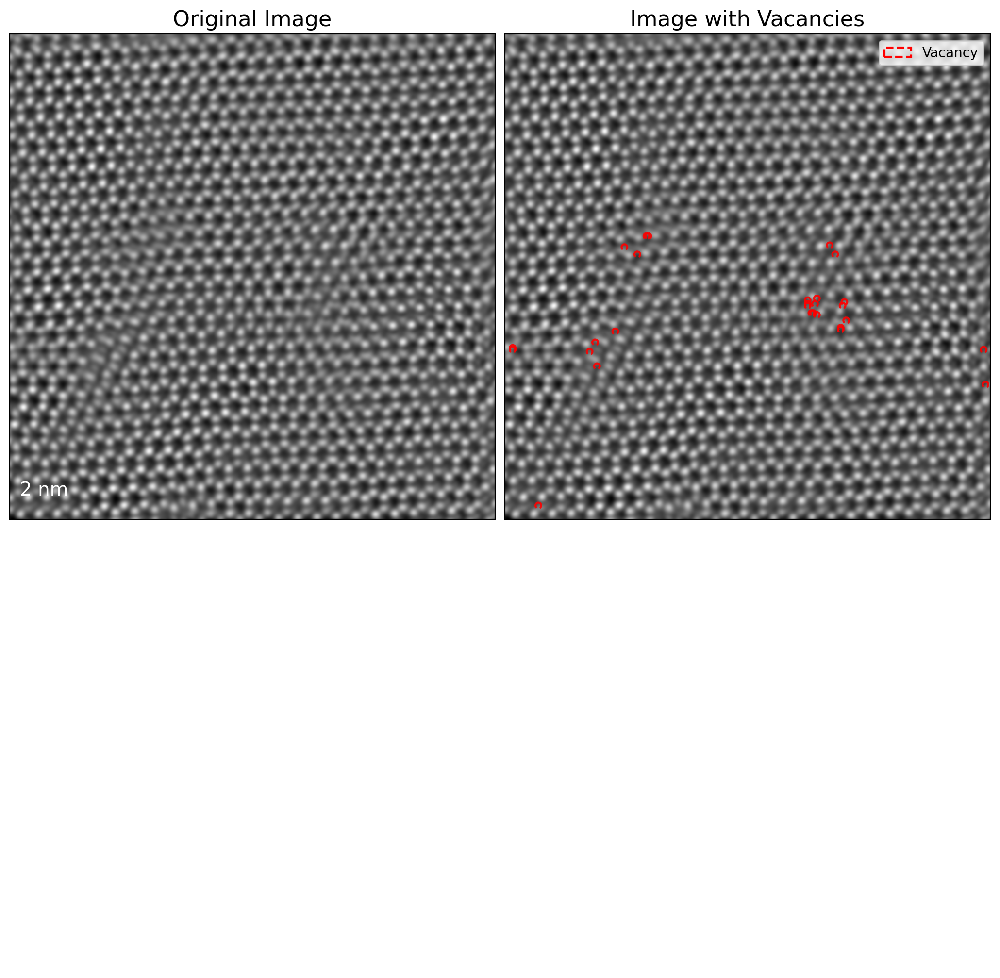

In [40]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
import matplotlib.patches as mpatches

fig = plt.figure(figsize=(10.2, 5), dpi=200)
ax1 = fig.add_axes([0, 0, 0.5, 1], xticks=[], yticks=[])
ax2 = fig.add_axes([0.5, 0, 0.5, 1], xticks=[], yticks=[])

# ---- Subplot 1: Original image
ax1.imshow(nIm, cmap='gray')
ax1.add_patch(Rectangle((10, 985), 2 / cal, 0.2 / cal, fc="white"))
ax1.text(10, 490, '2 nm', ha='left', va='bottom', fontsize=14, color='white')
ax1.set_title('Original Image', fontsize=16)

# ---- Subplot 2: Image with vacancies overlay
ax2.imshow(nIm, cmap='gray')

# vacancies_rc should be a list/array of [row, col]
for (row, col) in vacancies_rc:
    ax2.add_patch(
        Circle(
            (col, row),          # matplotlib uses (x=col, y=row)
            radius=1.5 * r,
            fill=False,          # outline only
            ec='red',            # RED vacancy outline
            lw=1.5,
            ls='--',
            alpha=0.9
        )
    )

ax2.add_patch(Rectangle((10, 985), 2 / cal, 0.2 / cal, fc="white"))
ax2.text(10, 985, '2 nm', ha='left', va='bottom', fontsize=14, color='white')
ax2.set_title('Image with Vacancies', fontsize=16)

# ---- Legend (single entry, red)
handle = mpatches.Patch(
    facecolor='none',
    edgecolor='red',
    linestyle='--',
    linewidth=1.5,
    label='Vacancy'
)
ax2.legend(handles=[handle], loc='upper right')

plt.show()


## Final Task

### Subtask:
Summarize the number of identified A-site and B-site vacancies and the method used for their detection.


## Summary:

### Q&A
The number of identified A-site vacancies is 0, and the number of B-site vacancies is 0. Vacancies were detected by first estimating lattice vectors using KMeans clustering on nearest-neighbor displacement vectors. Then, for each atom, potential neighbor locations were predicted. If a predicted neighbor was missing, it was marked as a potential vacancy. These potential vacancies were then classified as A-site or B-site based on the types of existing atoms in their immediate vicinity (an A-site vacancy required at least 2 B-neighbors and 0 A-neighbors, and a B-site vacancy required at least 2 A-neighbors and 0 B-neighbors within a `1.5 * r` radius), and duplicates were removed.

### Data Analysis Key Findings
*   The average nearest-neighbor displacement vectors were calculated using KMeans clustering and found to be `[[-0.08443641 -0.13596252], [ 0.15739856 -0.00821052], [-0.0728561 0.14396348]]` in real-space units.
*   Initially, 2094 potential A-site vacancies and 2149 potential B-site vacancies were identified based on missing neighbors.
*   After deduplication, classification, and filtering based on the local atomic environment (requiring at least two neighbors of the opposite type and zero neighbors of the same type within a `1.5 * r` radius), the final count of A-site vacancies was 0, and the final count of B-site vacancies was 0.
*   The visualization step confirmed that no vacancies met the defined classification criteria, as no red or yellow circles representing vacancies were plotted on the image.

### Insights or Next Steps
*   The current vacancy detection criteria are highly stringent, resulting in no identified vacancies. This suggests that the material might be nearly defect-free, or the chosen criteria for classification (e.g., `num_A_neighbors == 0` for B-site vacancy) may be too strict for the data's noise level or the actual defect structure.
*   To potentially identify vacancies, consider relaxing the classification criteria (e.g., allowing for a small number of same-site neighbors or reducing the minimum number of opposite-site neighbors), or exploring more sophisticated vacancy detection algorithms that account for local lattice distortions.


In [ ]:
fig = plt.figure(figsize=(10.2, 5), dpi=200)
ax1 = fig.add_axes([0, 0, 0.5, 1], xticks=[], yticks=[])
ax2 = fig.add_axes([0.5, 0, 0.5, 1], xticks=[], yticks=[])

# Subplot 1: Original nIm without overlays
ax1.imshow(nIm, cmap='gray')
ax1.add_patch(Rectangle((10, 985), 2 / cal, 0.2 / cal, fc="white"))
ax1.text(10, 985, '2 nm', ha='left', va='bottom', fontsize=14, color='white')
ax1.set_title('Original Image', fontsize=16)

# Subplot 2: nIm with vacancies overlaid
ax2.imshow(nIm, cmap='gray')

# Overlay A-site vacancies as red dashed circles
for vacancy_pos in final_A_vacancies:
    ax2.add_patch(Circle((vacancy_pos[1], vacancy_pos[0]), alpha=0.6, radius=1.5 * r, fc='r', ec='r', ls='--', lw=1, label='A-site Vacancy'))

# Overlay B-site vacancies as yellow dashed circles
for vacancy_pos in final_B_vacancies:
    ax2.add_patch(Circle((vacancy_pos[1], vacancy_pos[0]), alpha=0.6, radius=1.5 * r, fc='Yellow', ec='Yellow', ls='--', lw=1, label='B-site Vacancy'))

ax2.add_patch(Rectangle((10, 985), 2 / cal, 0.2 / cal, fc="white"))
ax2.text(10, 985, '2 nm', ha='left', va='bottom', fontsize=14, color='white')
ax2.set_title('Image with Vacancy Candidates', fontsize=16)

# Create a legend for the vacancies
handles_legend = [
    mpatches.Circle((0, 0), radius=1.5*r, fc='r', ec='r', ls='--', lw=1, label='A-site Vacancy'),
    mpatches.Circle((0, 0), radius=1.5*r, fc='Yellow', ec='Yellow', ls='--', lw=1, label='B-site Vacancy')
]
ax2.legend(handles=handles_legend, loc='upper right', handler_map={mpatches.Circle: HandlerEllipse()})

plt.show()